Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


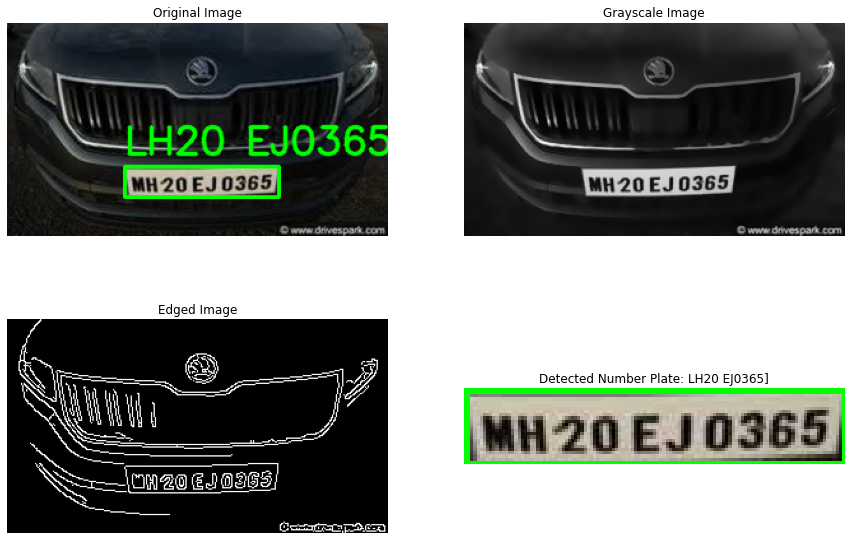

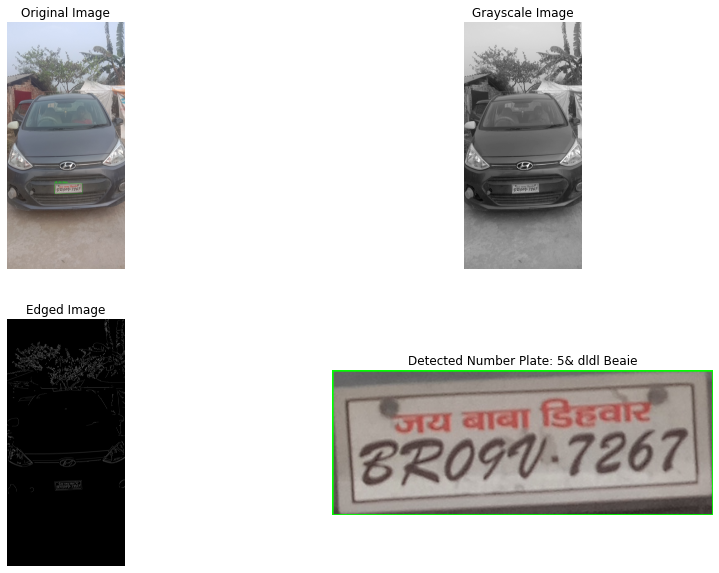

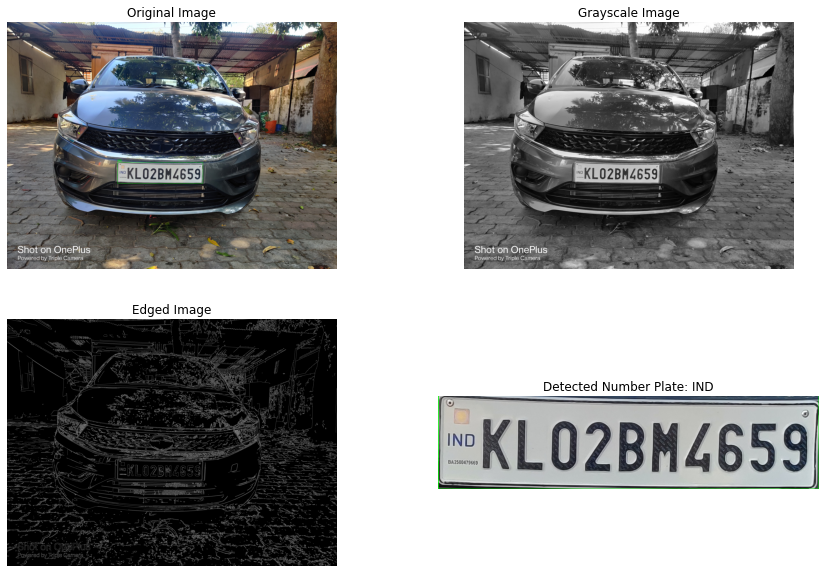

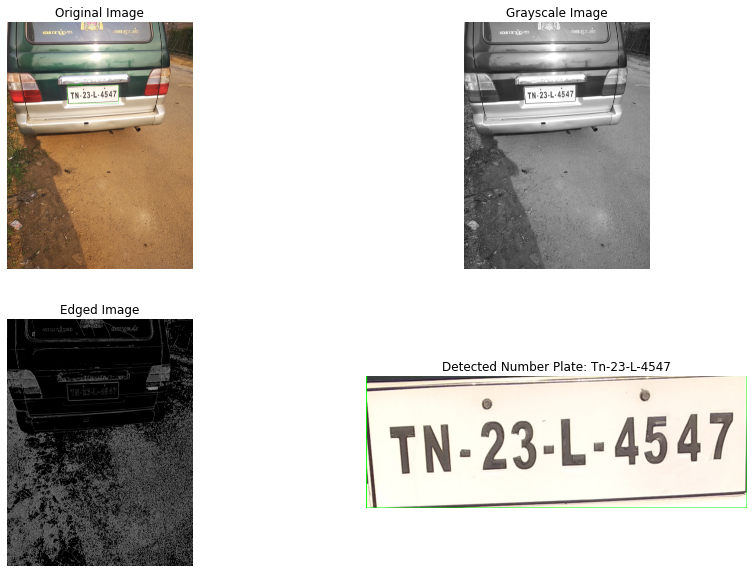

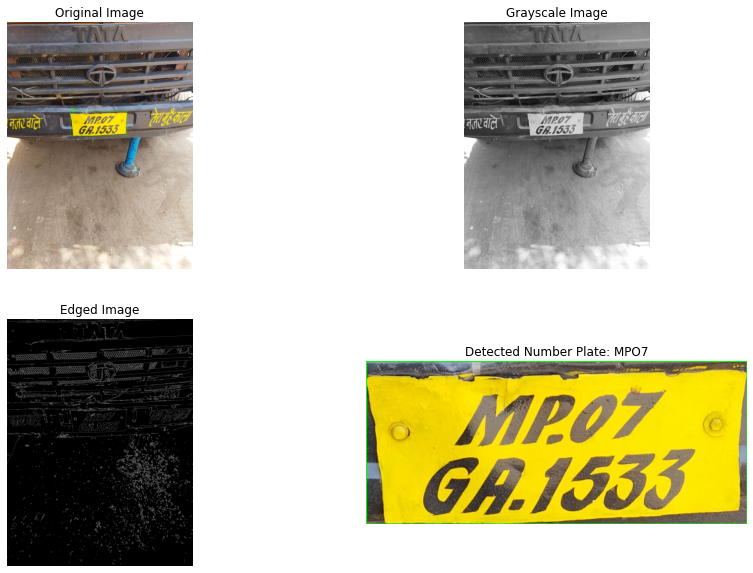

...

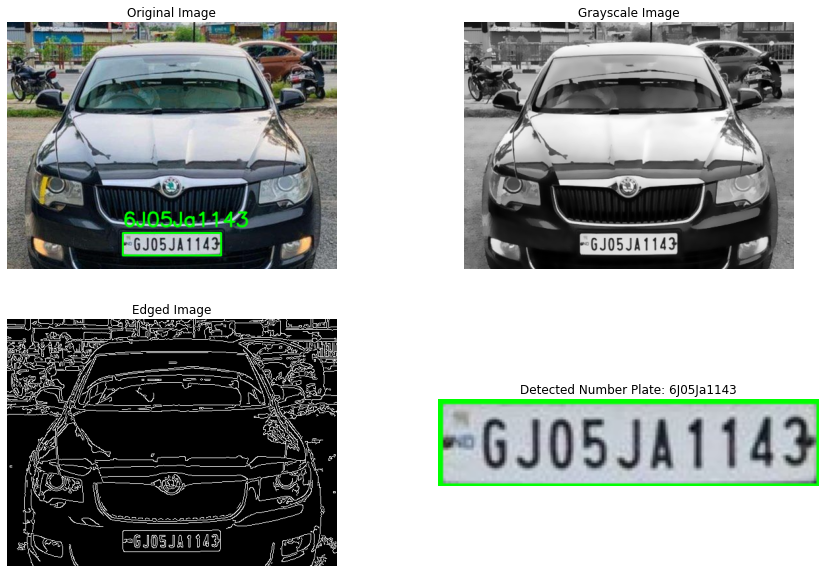

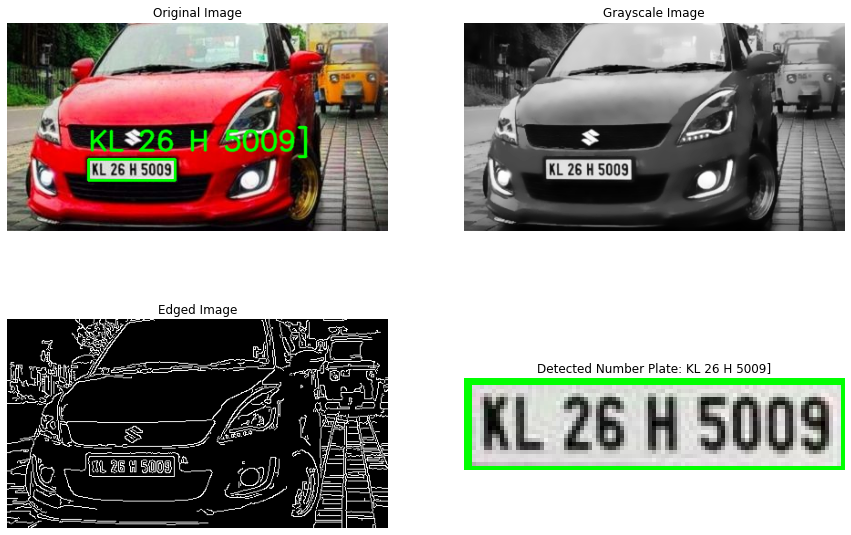

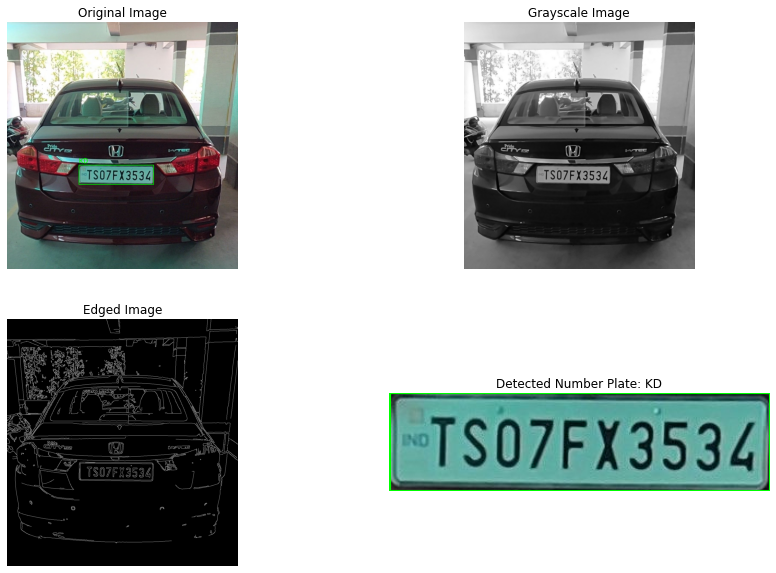

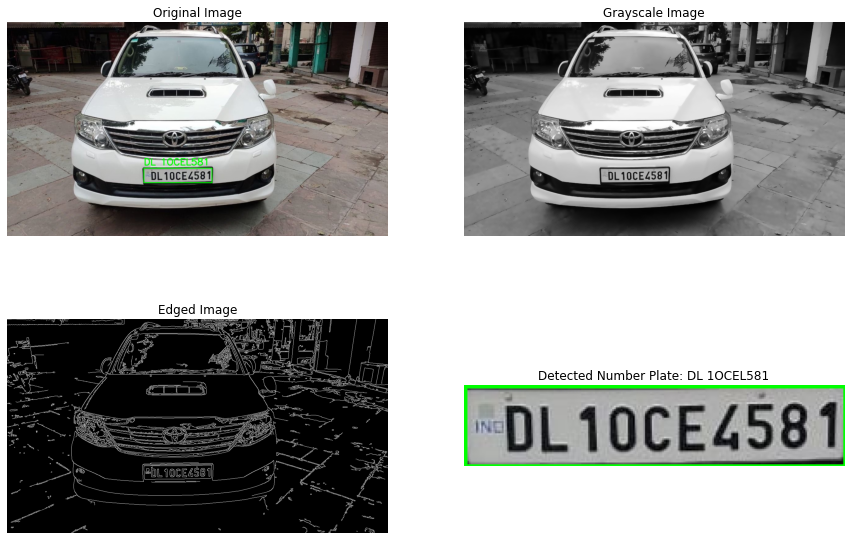

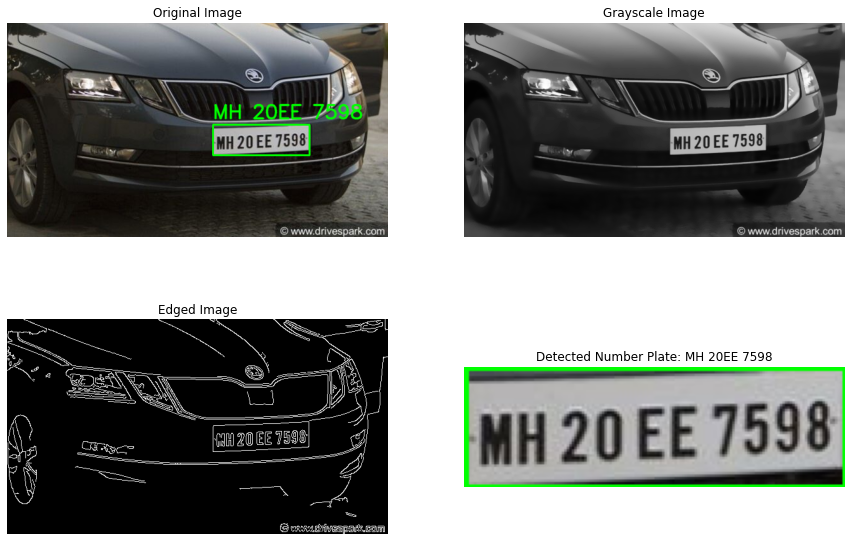

In [2]:
import cv2
import numpy as np
import easyocr
import matplotlib.pyplot as plt
import glob

# Initialize EasyOCR reader
reader = easyocr.Reader(['en'])

def preprocess_image(image):
    """Preprocess the image for better number plate detection."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.bilateralFilter(gray, 11, 17, 17)
    edged = cv2.Canny(gray, 30, 200)
    return gray, edged

def detect_number_plate(image, edged):
    """Detect the number plate region in the image."""
    contours, _ = cv2.findContours(edged.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:10]
    for contour in contours:
        approx = cv2.approxPolyDP(contour, 0.018 * cv2.arcLength(contour, True), True)
        if len(approx) == 4:
            x, y, w, h = cv2.boundingRect(contour)
            return image[y:y+h, x:x+w], contour
    return None, None

def recognize_number_plate(image_path):
    """Recognize the number plate from the image."""
    img = cv2.imread(image_path)
    gray, edged = preprocess_image(img)
    number_plate_image, contour = detect_number_plate(img, edged)
    
    text = "Not detected"
    if number_plate_image is not None:
        result = reader.readtext(number_plate_image)
        if result:
            text = result[0][-2]
            x, y, w, h = cv2.boundingRect(contour)
            font = cv2.FONT_HERSHEY_SIMPLEX
            cv2.putText(img, text, (x, y-10), font, 1, (0, 255, 0), 2, cv2.LINE_AA)
            cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
    
    # Plot the results in different sections
    fig, axs = plt.subplots(2, 2, figsize=(15, 10))
    axs[0, 0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axs[0, 0].set_title('Original Image')
    axs[0, 0].axis('off')
    
    axs[0, 1].imshow(gray, cmap='gray')
    axs[0, 1].set_title('Grayscale Image')
    axs[0, 1].axis('off')
    
    axs[1, 0].imshow(edged, cmap='gray')
    axs[1, 0].set_title('Edged Image')
    axs[1, 0].axis('off')
    
    if number_plate_image is not None:
        axs[1, 1].imshow(cv2.cvtColor(number_plate_image, cv2.COLOR_BGR2RGB))
        axs[1, 1].set_title(f'Detected Number Plate: {text}')
    else:
        axs[1, 1].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[1, 1].set_title('Number Plate Not Detected')
    axs[1, 1].axis('off')
    
    plt.show()

# Path to the dataset folder
dataset_folder = 'Dataset/*.jpg'

# Process each image in the dataset folder
for image_path in glob.glob(dataset_folder):
    recognize_number_plate(image_path)
